In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# Define the environment and initial conditions
GRID_SIZE = 75
POPULATION_SIZE = 100
INITIAL_INFECTED = 5
INITIAL_SUSCEPTIBLE = POPULATION_SIZE - INITIAL_INFECTED

# Define the agent states
SUSCEPTIBLE = 0
INFECTED = 1
RECOVERED = 2

# Define the agent behavior parameters
MOVEMENT_SPEED = 1  # Pixels per time step

class Agent():
    def __init__(self, x, y, state):
        self.x = x
        self.y = y
        self.state = state

    def move(self):
        dx = np.random.randint(-MOVEMENT_SPEED, MOVEMENT_SPEED + 1)
        dy = np.random.randint(-MOVEMENT_SPEED, MOVEMENT_SPEED + 1)
        self.x = (self.x + dx) % GRID_SIZE
        self.y = (self.y + dy) % GRID_SIZE

    def update_state(self, state):
        self.state = state
    
    def is_neighbor(self, other, nearby=1):
        return abs(self.x - other.x) <= nearby and abs(self.y - other.y) <= nearby

# Initialize the population
def initialize_population():
    population = [Agent(*np.random.randint(0, GRID_SIZE, 2), INFECTED) for _ in range(INITIAL_INFECTED)]
    population.extend([Agent(*np.random.randint(0, GRID_SIZE, 2), SUSCEPTIBLE) for _ in range(INITIAL_SUSCEPTIBLE)])
    return population

# Simulate agent movement and infection/recovery dynamics
def simulate_time_step(population, P, Q, nearby=1):
    """
    Simulate a time step of the epidemic spread.
    Args:
        population (list): List of Agent objects representing the population.
        P (float): Infection probability.
        Q (float): Recovery probability.
    """
    # Move agents
    for agent in population:
        agent.move()

    # Update agent states
    for agent in population:
        if agent.state == SUSCEPTIBLE:
            # Check for infection from neighboring infected agents
            is_infected_neighbor = any([agent.is_neighbor(other, nearby) and other.state == INFECTED for other in population])
            if is_infected_neighbor and np.random.rand() < P:
                agent.update_state(INFECTED)
        elif agent.state == INFECTED:
            # Check for recovery
            if np.random.rand() < Q:
                agent.update_state(RECOVERED)

    return population

# Visualize the simulation using Matplotlib animation
def visualize_simulation(population, time_steps=200, P=0.05, Q=0.1, nearby=1):
    # Set up the figure and axis
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_xlim(0, GRID_SIZE)
    ax.set_ylim(0, GRID_SIZE)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_title('Epidemic Simulation')

    # Create scatter plot
    x_data = [agent.x for agent in population]
    y_data = [agent.y for agent in population]
    colors = ['green' if agent.state == SUSCEPTIBLE else 'red' if agent.state == INFECTED else 'blue' for agent in population]
    scatter = ax.scatter(x_data, y_data, c=colors, s=20)

    # Lists to store data for plotting
    susceptible_counts = []
    infected_counts = []
    recovered_counts = []

    def update(frame):
        nonlocal population
        population = simulate_time_step(population, P, Q, nearby)

        # Update data
        x_data = [agent.x for agent in population]
        y_data = [agent.y for agent in population]
        colors = ['green' if agent.state == SUSCEPTIBLE else 'red' if agent.state == INFECTED else 'blue' for agent in population]

        scatter.set_offsets(np.c_[x_data, y_data])
        scatter.set_color(colors)

        # Update counts
        susceptible_counts.append(np.sum([agent.state == SUSCEPTIBLE for agent in population]))
        infected_counts.append(np.sum([agent.state == INFECTED for agent in population]))
        recovered_counts.append(np.sum([agent.state == RECOVERED for agent in population]))

        # Update title with counts
        ax.set_title(f'Epidemic Simulation (Time Step: {frame})\nSusceptible: {susceptible_counts[-1]} | Infected: {infected_counts[-1]} | Recovered: {recovered_counts[-1]}')

        return scatter,

    anim = FuncAnimation(fig, update, frames=time_steps, interval=100, blit=False)
    plt.close(fig)
    return anim, susceptible_counts, infected_counts, recovered_counts


## Run the Simulation with p=0.05, q= 0.02

In [9]:

# Initialize the population
population = initialize_population()

# Run the simulation and get the animation
anim, susceptible, infected, recovered = visualize_simulation(population, time_steps=200, P=0.05, Q=0.02, nearby=10)

# Display the animation in Jupyter Notebook
HTML(anim.to_jshtml())


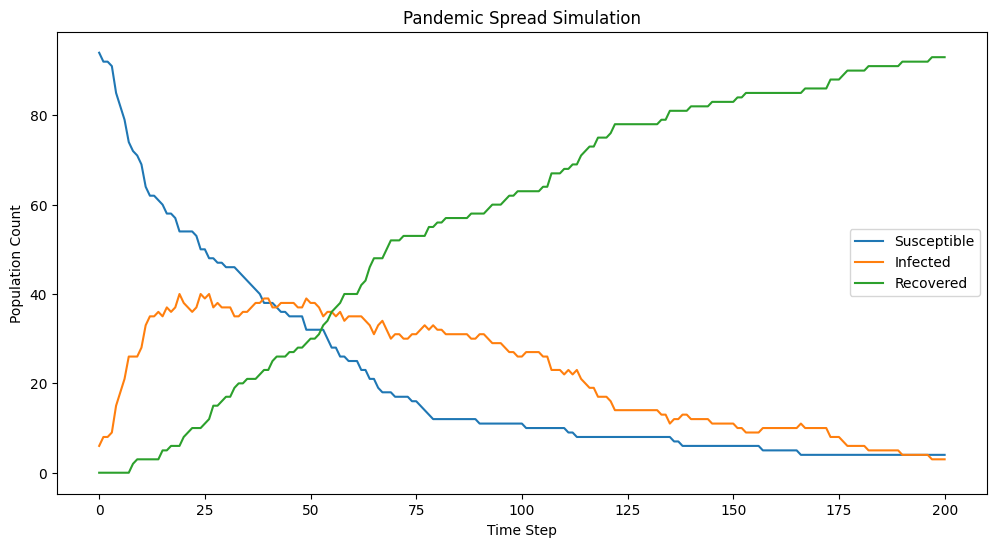

In [10]:
plt.figure(figsize=(12, 6))
plt.plot(susceptible, label='Susceptible')
plt.plot(infected, label='Infected')
plt.plot(recovered, label='Recovered')
plt.xlabel('Time Step')
plt.ylabel('Population Count')
plt.title('Pandemic Spread Simulation')
plt.legend()
plt.show()


## Run Simulation with p = 0.1, q = 0.05

In [11]:
# Initialize the population
population = initialize_population()

# Run the simulation and get the animation
anim, susceptible, infected, recovered = visualize_simulation(population, time_steps=200, P=0.1, Q=0.05, nearby=10)

# Display the animation in Jupyter Notebook
HTML(anim.to_jshtml())


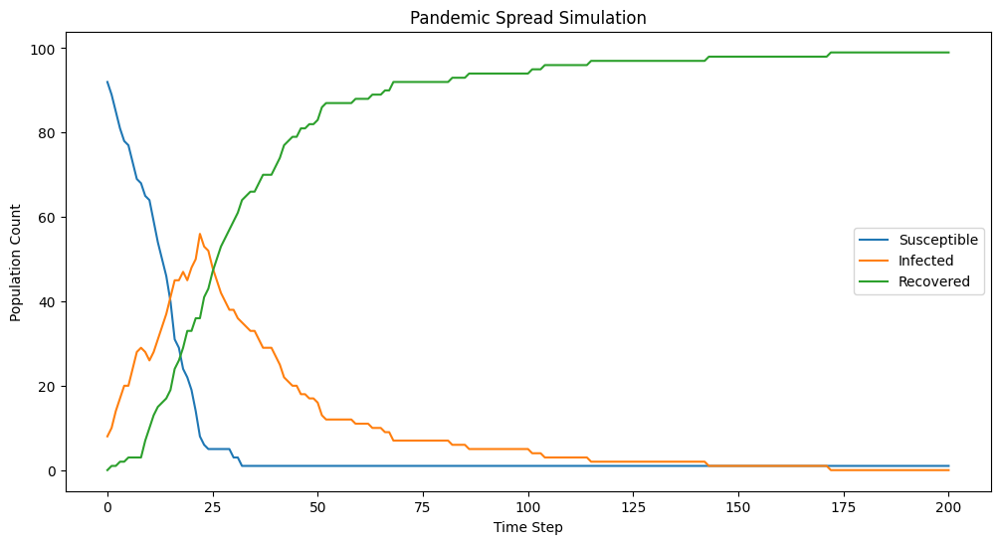

In [12]:
plt.figure(figsize=(12, 6))
plt.plot(susceptible, label='Susceptible')
plt.plot(infected, label='Infected')
plt.plot(recovered, label='Recovered')
plt.xlabel('Time Step')
plt.ylabel('Population Count')
plt.title('Pandemic Spread Simulation')
plt.legend()
plt.show()

With a larger number of p and q, it shows a higher infection peak, indicating more agents are getting infected at the same time. And also an ealier time to peak, when use a larget number of p and q. The overall population recovery tends to aproach the total population size.

## Rerun with different random initial conditions

In [17]:
susceptibles, infecteds, recovereds = [], [], []
for i in range(20):
    population = initialize_population()
    anim, susceptible, infected, recovered = visualize_simulation(population, time_steps=200, P=0.1, Q=0.05, nearby=10)
    HTML(anim.to_jshtml())
    susceptibles.append(susceptible)
    infecteds.append(infected)
    recovereds.append(recovered)

c:\Users\YWU866\AppData\Local\miniconda3\Lib\site-packages\matplotlib\animation.py:872: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


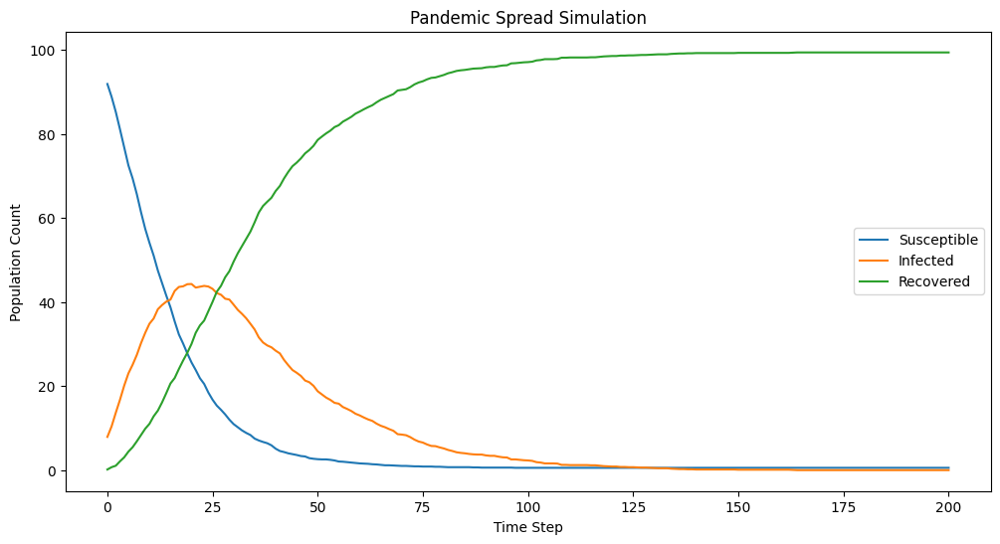

In [21]:

# Plot the average counts over multiple simulations
# plt.figure(figsize=(12, 6))
plt.figure(figsize=(12, 6))
plt.plot(np.mean(susceptibles, axis=0), label='Susceptible')
plt.plot(np.mean(infecteds, axis=0), label='Infected')
plt.plot(np.mean(recovereds, axis=0), label='Recovered')
plt.xlabel('Time Step')
plt.ylabel('Population Count')
plt.title('Pandemic Spread Simulation')
plt.legend()
plt.show()

When the infection peak arrives, the number of recovered population begins to be larger than the number of susceptible population.

# B

i.1 The movement. Assigning a probability of movement can simulate this behavior.

i.2 Also can be the movement. When agent moves, it can avoid that cell.

i.3 To simulate the behavior, we can simply reduce the parameter `nearby` to indicate fewer area each agent can affect


In [2]:
susceptibles, infecteds, recovereds = [], [], []
for i in range(20):
    population = initialize_population()
    anim, susceptible, infected, recovered = visualize_simulation(population, time_steps=200, P=0.1, Q=0.05, nearby=5)
    HTML(anim.to_jshtml())
    susceptibles.append(susceptible)
    infecteds.append(infected)
    recovereds.append(recovered)

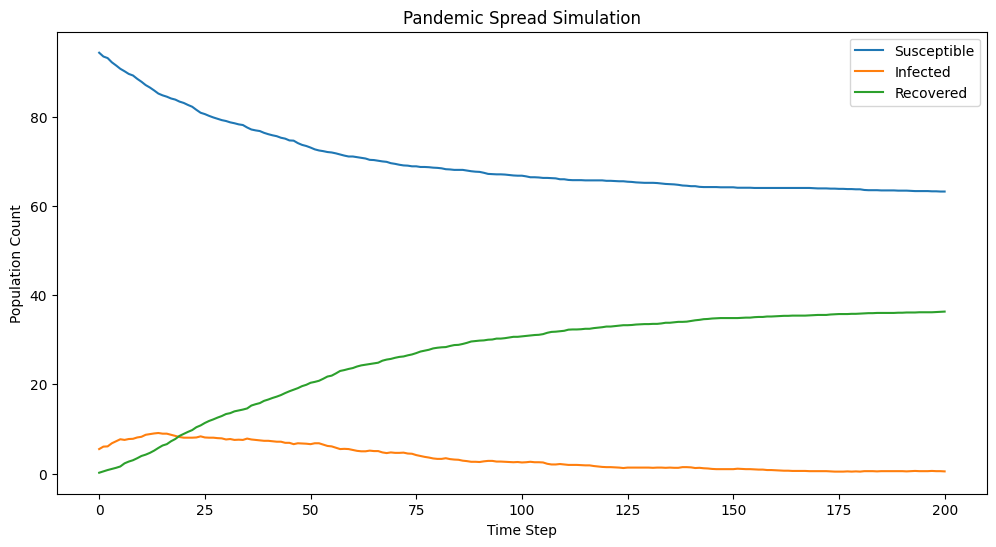

In [3]:
plt.figure(figsize=(12, 6))
plt.plot(np.mean(susceptibles, axis=0), label='Susceptible')
plt.plot(np.mean(infecteds, axis=0), label='Infected')
plt.plot(np.mean(recovereds, axis=0), label='Recovered')
plt.xlabel('Time Step')
plt.ylabel('Population Count')
plt.title('Pandemic Spread Simulation')
plt.legend()
plt.show()

i.4 in my case, it's `nearby` impacts the maximum number of infected subjects

ii. With social distancing, the peak number of infected dramasticly decreased and tend to a certain number which is much lower than the total population. The time for infection to peak get shorten , and it become earlier for the population to reach a stable recovered state. As shown in the figure, it seems the infection get well controlled. The speed of infection get slower, however, the duration gets longer than before. Social distancing can heavily reduce infection rates, can also shorten the timing of infection peaks. However, it takes longer time for the population to get recovered into a stable trend. It is easy to imply that everyone should keep distance during our daily lives to prevent infection.

### iii. additionaly Sensitivity Analysis

In [4]:
susceptibles, infecteds, recovereds = [], [], []
for i in range(20):
    population = initialize_population()
    anim, susceptible, infected, recovered = visualize_simulation(population, time_steps=200, P=0.1, Q=0.05, nearby=1)
    HTML(anim.to_jshtml())
    susceptibles.append(susceptible)
    infecteds.append(infected)
    recovereds.append(recovered)

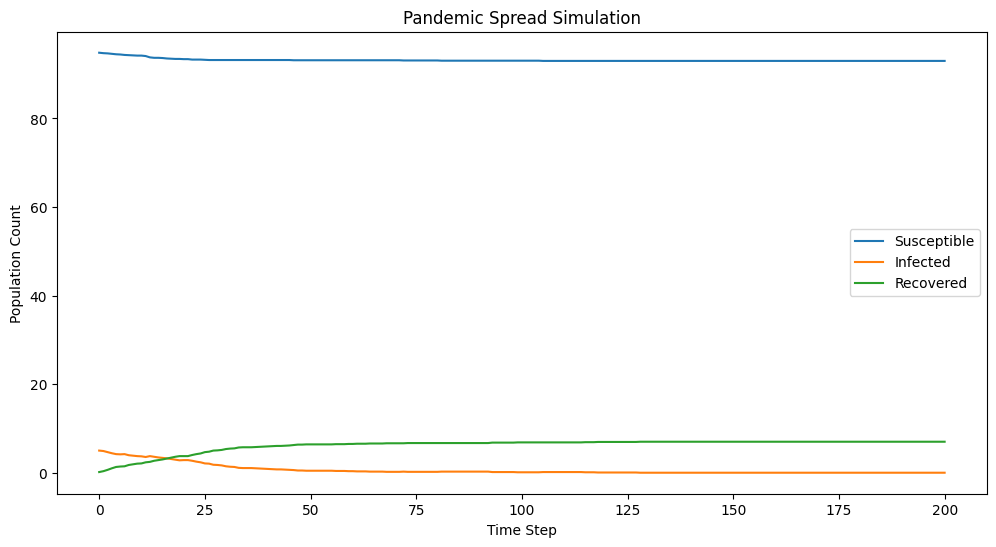

In [5]:
plt.figure(figsize=(12, 6))
plt.plot(np.mean(susceptibles, axis=0), label='Susceptible')
plt.plot(np.mean(infecteds, axis=0), label='Infected')
plt.plot(np.mean(recovereds, axis=0), label='Recovered')
plt.xlabel('Time Step')
plt.ylabel('Population Count')
plt.title('Pandemic Spread Simulation')
plt.legend()
plt.show()

A strong restriction of socal distance can significantly reduce the infection. 